<a href="https://www.kaggle.com/code/martinab/credit-card-fraud-detection?scriptVersionId=113900916" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Credit Card - Fraud Detection

Credit card fraud is any kind of theft or fraud that involves a credit card. The aim of credit card fraud is to purchase goods without paying, or to steal money from someone else’s credit account.

We can break down the types of credit card fraud into four main areas:

 1. Lost or stolen cards that are used without their owner’s permission
 2. Skimmed cards - this is when the card is cloned or copied with a special swipe machine to make a duplicate of the card
 3. Card-not-present - card details such as card number, holder/account name, date of birth and address are stolen, often from online databases or through phishing, then sold and used on the internet, or over the phone
 4. Committing fraudulent applications in someone else’s name for a new credit card, without that person knowing 

<img src='https://menafn.com/updates/pr/2019-12/03/N_38956036-3image_story.jpg' width=600 align='center'/>

Credit card fraud is in general a rare event in comparison to the amount of genuine transactions. We can expect the dataset to be imbalanced and with only small ratio of data being fraudulent.

This brings some challenges! We can get a high accuracy score by predicting majority class (not fraudulent) but might fail to predict minority class. This is actually contradicting with our aim - to highlight and prevent from fraudulent transactions. 





### Importing Libraries

In [1]:
# Importing libraries:

# Importing numpy, pandas, matplotlib and seaborn:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Imports for plotly:
import plotly.graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots


# To keep graph within the nobebook:
%matplotlib inline

# To hide warnings
import warnings
warnings.filterwarnings('ignore')

### Loading the Data and Initial Exploration

In [2]:
# Read data from dataset's csv file:
df = pd.read_csv('../input/creditcardfraud/creditcard.csv')

In [3]:
# Display the shape of dataset (#of rows, #of columns):
print('The shape of the dataset is: ', df.shape)

The shape of the dataset is:  (284807, 31)


In [4]:
# Show first 5 rows of dataset:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
# Explore dataframe's statistics (numerical values only):
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,3.919560e-15,5.688174e-16,-8.769071e-15,2.782312e-15,-1.552563e-15,2.010663e-15,-1.694249e-15,-1.927028e-16,-3.137024e-15,...,1.537294e-16,7.959909e-16,5.367590e-16,4.458112e-15,1.453003e-15,1.699104e-15,-3.660161e-16,-1.206049e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [6]:
# Function to describe variables
def desc(df):
    d = pd.DataFrame(df.dtypes,columns=['Data_Types'])
    d = d.reset_index()
    d['Columns'] = d['index']
    d = d[['Columns','Data_Types']]
    d['Missing'] = df.isnull().sum().values    
    d['Uniques'] = df.nunique().values
    return d

# Use desc() function to describe df:
desc(df)

,Columns,Data_Types,Missing,Uniques
0,Time,float64,0,124592
1,V1,float64,0,275663
2,V2,float64,0,275663
3,V3,float64,0,275663
4,V4,float64,0,275663
5,V5,float64,0,275663
6,V6,float64,0,275663
7,V7,float64,0,275663
8,V8,float64,0,275663
9,V9,float64,0,275663


### Exploratory Data Analysis (EDA)

In [7]:
# Class distribution dataframe:

cls_df = pd.DataFrame(df.groupby(['Class'])['Class'].count())
cls_df['Category'] = ['Not-Fraud', 'Fraud']

# Create bar chart for class distribution:

data=go.Bar( x = cls_df.Category
           , y = cls_df.Class
           ,  marker=dict( color=['#4c5cff', '#ff4682'])
           , text=cls_df.Class
           , textposition='auto' 
           )



layout = go.Layout( title = 'Class distribution'
                  , xaxis = dict(title = 'Class')
                  , yaxis = dict(title = 'Volume')
                  )

fig = go.Figure(data,layout)

fig.show()

In [8]:
# Count the occurrences of Fraud and Not-Fraud:
vol = df.Class.value_counts()

# Print the % of Not-Fraud and Fraud cases:
print(vol * 100 / len(df.index))

0    99.827251
1     0.172749
Name: Class, dtype: float64


We can now see how imbalanced the dataset is. About 99.8% transactions are genuine and those identified as fraudulent represent approximately 0.2%. We can get over 99% model accuracy easily just by assuming that every transaction Class is equal to 0. This sounds great!

Actually it's not great news. Our model won't have enough data for fraudulent transactions to learn how to recognise them. This will cause that we won't be able to capture fraud.

In reality Fraud Analytics teams use the combination of different techniques to identify fraud, for example:
 - Rules based systems, with thresholds set manually and based on previous experience;
 - Matching data to external lists of fraudulet accounts and names;
 - Use machine learning algorithms to detect fraud or suspicious behaviour

In [9]:
# Scatter graph for Distribution of Transactions split by Category (Not-Fraud/Fraud):

df['Category'] = df['Class'].map({0:'Not-Fraud', 1:'Fraud'})

fig = px.scatter(df
                 , x='V15'
                 , y='Amount'
                 , color = 'Category'
                 , size = 'Amount'
                 #, facet_col='Category'
                 , color_continuous_scale= ['#4c5cff','#ff4682']
                 , render_mode="webgl"
                )

fig.update_layout(title='Distribution of Transactions - by Category'
                  , xaxis_title='V15'
                  , yaxis_title='Transaction Value ($)'
                 )

fig.show()

From the visualistion above, we can see that only minority of transactions is fraud related. It is also interesting to find out that fraudulent transactions tend to be of lower amount (below $2,000).

In [10]:
# Correlation matrix for Credit Card - Fraud Detection dataset features:

corr = df.corr()
l = list(corr.columns)

fig = go.Figure(data=go.Heatmap(z=corr
                                , x=l
                                , y=l
                                , hoverongaps = False
                                
                               )
               )

fig.update_layout(title='Correlation for Features')


fig.show()

There is no correlation between features V1 to V28. Class is not correlated with quite a few features, for example V19 to V28, Time and Amount.

In [11]:
# Create dataset for Fraud & Non-Fraud features (mask_1&mask_0 respectively):
mask_1 = df.loc[df.Class == 1]
mask_0 = df.loc[df.Class == 0]

# Create a list of columns (excluding Class and Category):
columns = list(df.columns)[0:-2]

The following visualisation is to give us more overview of distribution of features split by Class (Fraud or Not-Fraud). It's always a good practice to explore your features and gain more insight. 

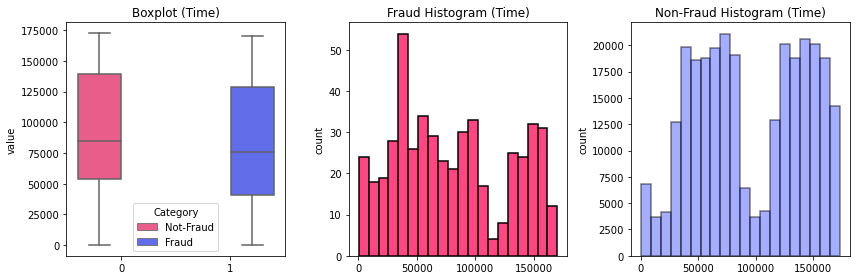

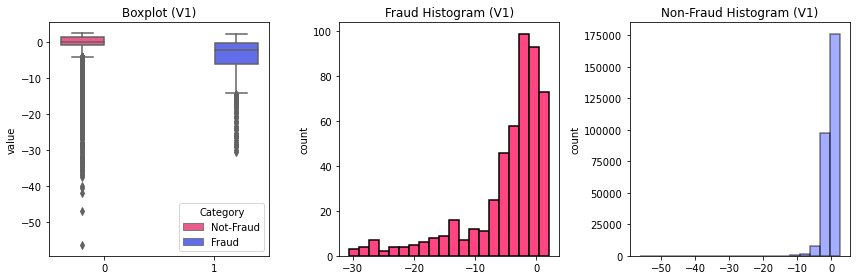

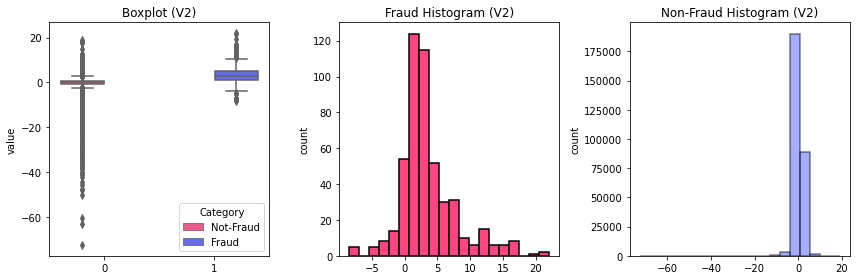

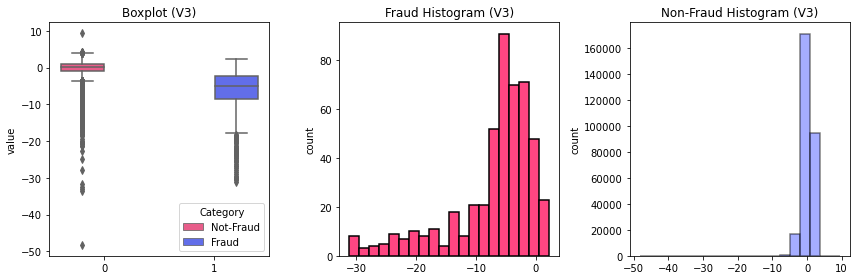

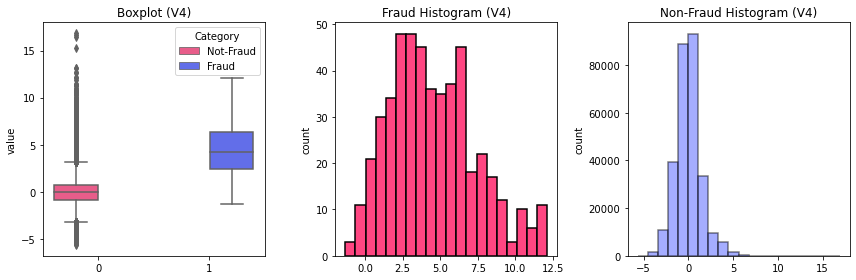

...

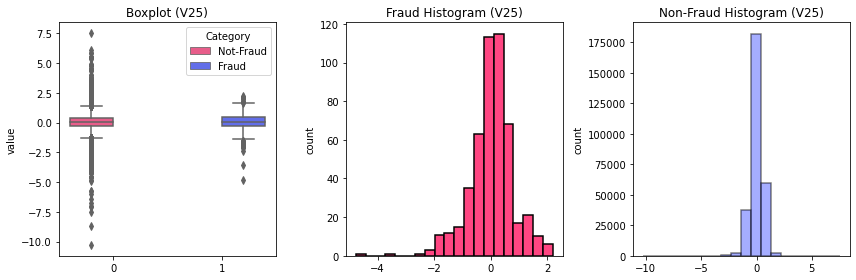

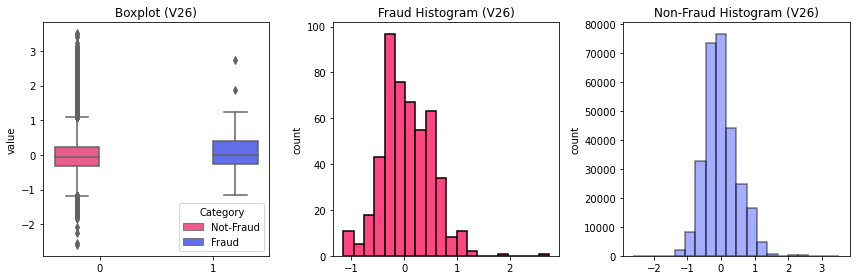

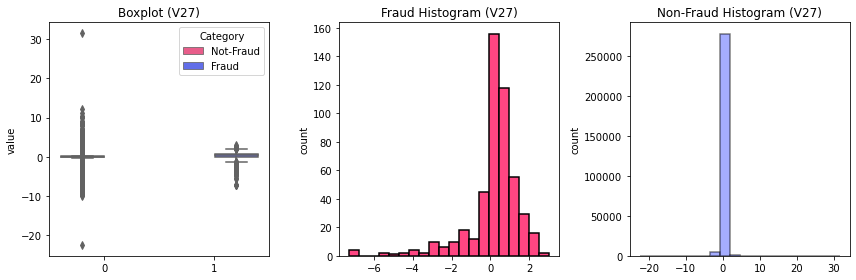

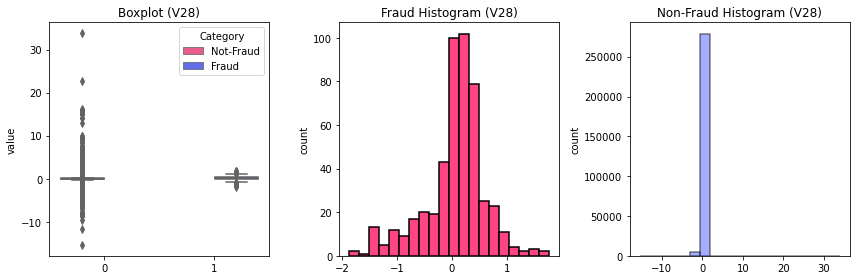

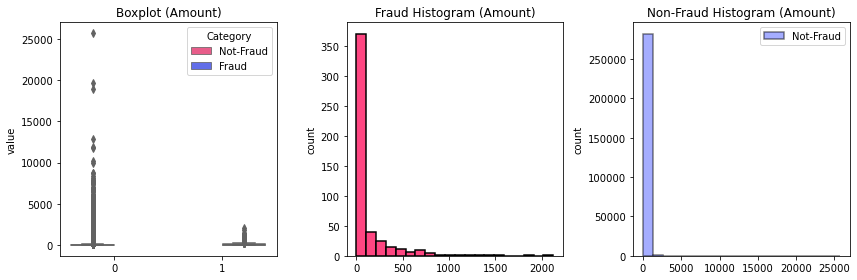

In [12]:
# Crate box plot and histograms for Fraud and Not-Fraud transactions:
for i in columns:
    fig = plt.figure(figsize = (12,4))

    plt.subplot(1,3,1)
    sns.boxplot(x='Class',
                y=i,
                hue='Category', 
                palette=  ['#ff4682','#4c5cff'],
                data=df
                )

    # Label axes
    plt.title('Boxplot '+'('+i+')')
    plt.xlabel('')
    plt.ylabel('value')
    
    plt.tight_layout() 

    plt.subplot(1,3,2)
    plt.hist(x=i
         , edgecolor = 'black'
         , linewidth = 1.5
         , bins = 20
         , color = '#ff4682'
         , label = 'Fraud'
        # , alpha = 0.5
         , data=mask_1)

    # Label axes
    plt.title('Fraud Histogram '+'('+i+')')
    plt.xlabel('')
    plt.ylabel('count')
    plt.tight_layout() 

    plt.subplot(1,3,3)
    plt.hist(x=i
         , edgecolor = 'black'
         , linewidth = 1.5
         , bins = 20
         , color = '#4c5cff'
         , label = 'Not-Fraud'
         , alpha = 0.5
         , data=mask_0)

    # Label axes
    plt.title('Non-Fraud Histogram '+'('+i+')')
    plt.xlabel('')
    plt.ylabel('count')
    
    plt.tight_layout()    
    

# Display label
plt.legend(loc='best')


plt.show()


### Resampling Methods

We will try to incease a success rate of fraud detection by using dataresampling. There are a few techniques that can be used for example:

**UNDERSAMPLING**

Random Undersampling (RUS) - we throw away some data to make dataset more balanced. This technique is computationally efficient but requires huge amont of data.
<img src='https://miro.medium.com/max/335/1*YH_vPYQEDIW0JoUYMeLz_A.png' width=300 align='center'/>
**OVERSAMPLING**

Random Oversampling (ROS) - duplicating minority class (Fraud) to balance dataset. The disadvantage is that we are training our model on duplicates.
<img src='https://miro.medium.com/max/375/1*aKJJOozIlVVH1gT-4rYy4w.png' width=300 align='center'/>
**SMOTE**

Synthetic Minority Oversampling Technique (SMOTE) - this method creates data artificially to balance dataset. It creates more sophisticated and realistic dataset, but we are basically training on 'fake' data.

<img src='https://miro.medium.com/max/2760/1*bSOwLuDleEEGiuw7PtooOQ.png' width=300 align='center'/>

### Training the Data

It is important to apply train_test_split to our dataset to create train and test dataset before applying any of the resampling methods.

In [13]:
X=df.drop(['Time', 'Class', 'Category'], axis = 1)
y=df.Class

In [14]:
# Import train_test_split form sklearn:
from sklearn.model_selection import train_test_split

# Keep 30% of data for testing:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state=42)

In [15]:
# Count the occurrences of Fraud and Not-Fraud:
v = y_train.value_counts()

# Print the % of Not-Fraud and Fraud cases:
print(v * 100 / len(y_train.index))

0    99.821432
1     0.178568
Name: Class, dtype: float64


#### Applying SMOTE

In [16]:
from imblearn.over_sampling import SMOTE
smt = SMOTE()

In [17]:
# Transform the dataset

X, y = smt.fit_resample(X_train, y_train)

In [18]:
# Count the occurrences of Fraud and Not-Fraud:
v = y.value_counts()

# Print the % of Not-Fraud and Fraud cases:
print(v * 100 / len(y.index))

1    50.0
0    50.0
Name: Class, dtype: float64


In [19]:
from sklearn.linear_model import LogisticRegression

# Importing classification_method and confusion_matrix:
from sklearn.metrics import classification_report, confusion_matrix

In [20]:
# Fit a logistic regression model to our data
model = LogisticRegression()
model.fit(X_train, y_train)

# Obtain model predictions
y_pred = model.predict(X_test)

# Print the classifcation report and confusion matrix
print('Classification report:\n', classification_report(y_test, y_pred))
conf_mat = confusion_matrix(y_true=y_test, y_pred = y_pred)
print('Confusion matrix:\n', conf_mat)

Classification report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     85307
           1       0.85      0.64      0.73       136

    accuracy                           1.00     85443
   macro avg       0.93      0.82      0.87     85443
weighted avg       1.00      1.00      1.00     85443

Confusion matrix:
 [[85292    15]
 [   49    87]]


In [21]:
z = confusion_matrix(y_test, y_pred)

x = ['Genuine', 'Fraud']
y = ['Genuine', 'Fraud']

# change each element of z to type string for annotations
z_text = [[str(y) for y in x] for x in z]

# set up figure 
fig = ff.create_annotated_heatmap(z, x=x, y=y, annotation_text=z_text, colorscale='RdBu')

# add title
fig.update_layout(title_text='<i><b>Confusion matrix</b></i>',
                  #xaxis = dict(title='x'),
                  #yaxis = dict(title='x')
                 )

# add custom xaxis title
fig.add_annotation(dict(font=dict(color="black",size=14),
                        x=0.5,
                        y=-0.15,
                        showarrow=False,
                        text="Predicted value",
                        xref="paper",
                        yref="paper"))


# add custom yaxis title
fig.add_annotation(dict(font=dict(color="black",size=14),
                        x=-0.35,
                        y=0.5,
                        showarrow=False,
                        text="Real value",
                        textangle=-90,
                        xref="paper",
                        yref="paper"))

# adjust margins to make room for yaxis title
fig.update_layout(margin=dict(t=50, l=200))

# add colorbar
fig['data'][0]['showscale'] = True
fig.show()

In [22]:
# Import the random forest model from sklearn
from sklearn.ensemble import RandomForestClassifier

# Define the model as the random forest
model = RandomForestClassifier(random_state=5)

# Fit the model to our training set
model.fit(X_train, y_train)

# Obtain predictions from the test data 
predicted = model.predict(X_test)


In [23]:
# Import the packages to get the different performance metrics
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# Predict probabilities
probs = model.predict_proba(X_test)

# Print the ROC curve, classification report and confusion matrix
print(roc_auc_score(y_test, probs[:,1]))
print(classification_report(y_test, predicted))
print(confusion_matrix(y_test, predicted))

0.9545824630624753
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     85307
           1       0.93      0.80      0.86       136

    accuracy                           1.00     85443
   macro avg       0.97      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443

[[85299     8]
 [   27   109]]
